In [ ]:
!pip install kaggle pycocotools matplotlib pillow tqdm --quiet


In [ ]:
from google.colab import files

files.upload()  # Choose your kaggle.json file here


Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"tarunjayant","key":"1d23e581576863cb0864cc51bfc0fc7a"}'}

In [ ]:
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json


In [ ]:
# Only run the download command first!
!kaggle datasets download -d awsaf49/coco-2017-dataset -p coco-2017



Dataset URL: https://www.kaggle.com/datasets/awsaf49/coco-2017-dataset
License(s): CC-BY-SA-4.0
^C


In [8]:
!mkdir -p coco-2017



In [9]:
!kaggle datasets download -d awsaf49/coco-2017-dataset -p coco-2017


Dataset URL: https://www.kaggle.com/datasets/awsaf49/coco-2017-dataset
License(s): CC-BY-SA-4.0
^C


In [10]:
# Download annotation files and images directly
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip
!wget http://images.cocodataset.org/zips/train2017.zip
!wget http://images.cocodataset.org/zips/val2017.zip


--2025-10-28 12:50:36--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.216.51.17, 3.5.24.51, 16.15.218.213, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|52.216.51.17|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘annotations_trainval2017.zip’

annotations_trainva 100%[===================>] 241.19M  55.2MB/s    in 4.8s    

2025-10-28 12:50:41 (50.1 MB/s) - ‘annotations_trainval2017.zip’ saved [252907541/252907541]

--2025-10-28 12:50:41--  http://images.cocodataset.org/zips/train2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.217.83.180, 16.15.186.98, 3.5.21.127, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|52.217.83.180|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19336861798 (18G) [application/zip]
Saving to: ‘train2017.zip’

train

In [11]:
!unzip -qq annotations_trainval2017.zip -d coco-2017
!unzip -qq train2017.zip -d coco-2017
!unzip -qq val2017.zip -d coco-2017


In [12]:
ANNOTATION_FILE = "coco-2017/annotations/instances_train2017.json"
IMAGE_DIR = "coco-2017/train2017"



🔹 Visualizing 50 unique image–mask pairs...

🔹 Loading COCO annotations...
loading annotations into memory...
Done (t=17.82s)
creating index...
index created!


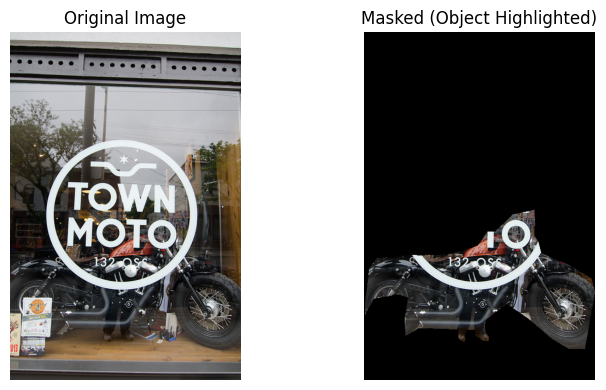

✅ Visualized 1/50


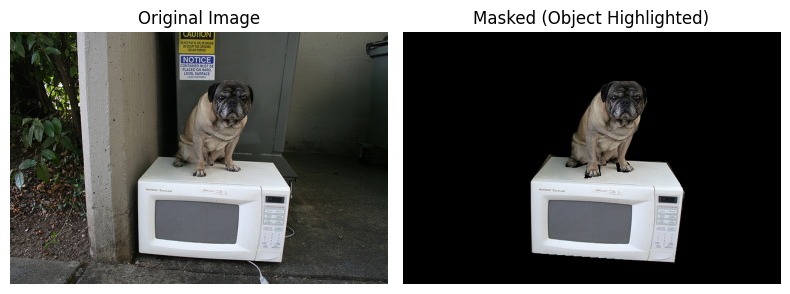

✅ Visualized 2/50


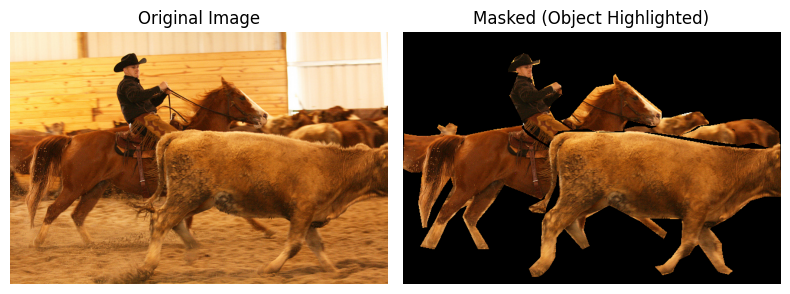

✅ Visualized 3/50


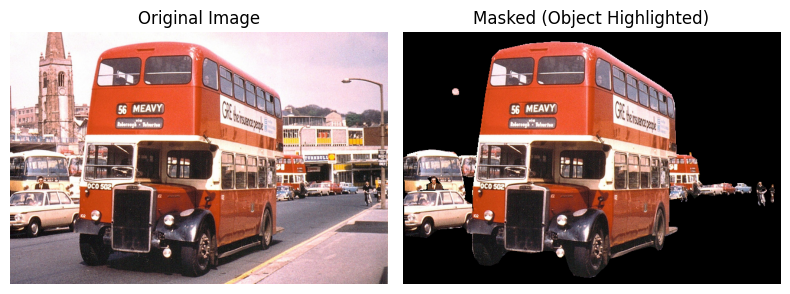

✅ Visualized 4/50


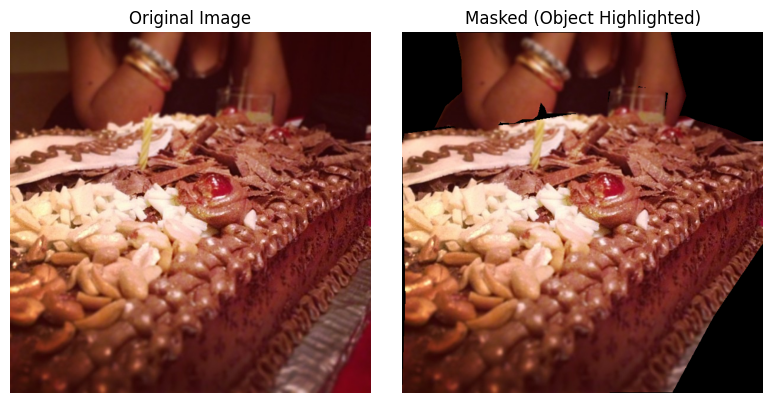

✅ Visualized 5/50


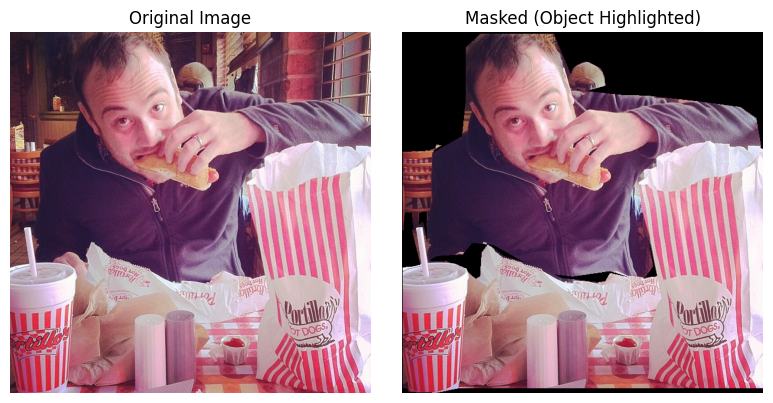

✅ Visualized 6/50


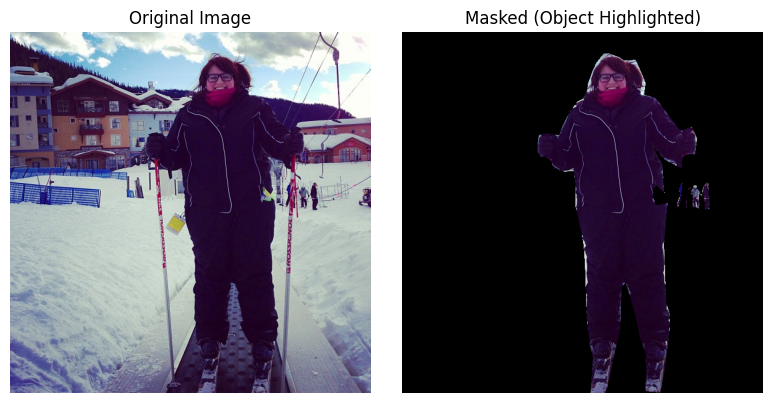

✅ Visualized 7/50


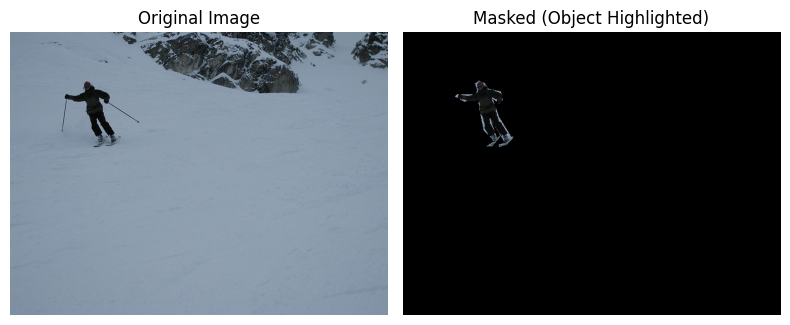

✅ Visualized 8/50


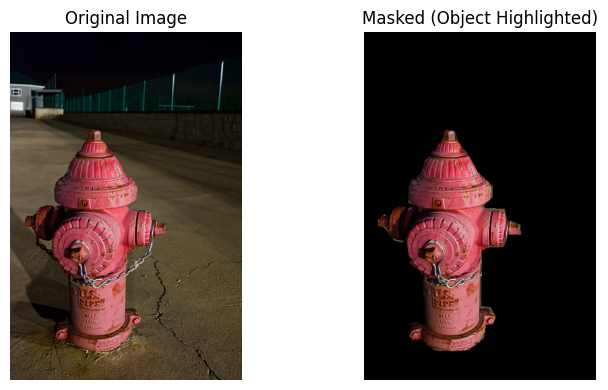

✅ Visualized 9/50


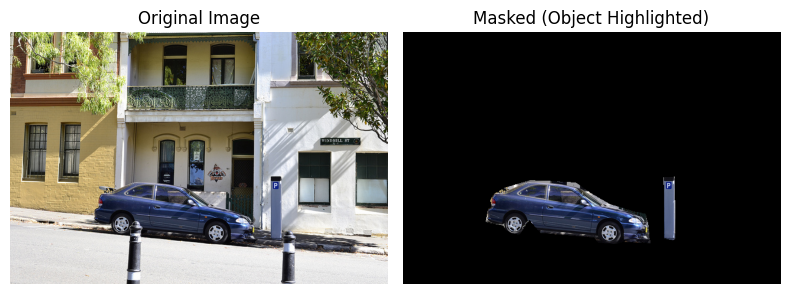

✅ Visualized 10/50


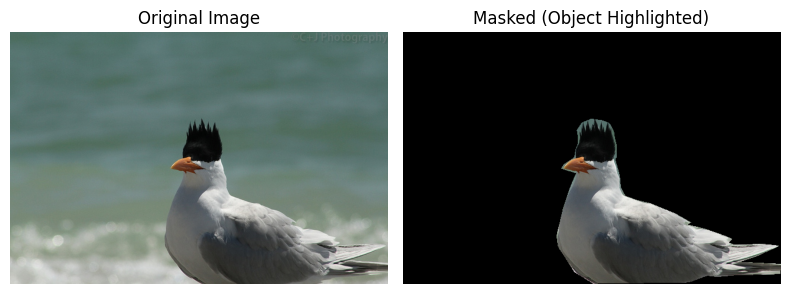

✅ Visualized 11/50


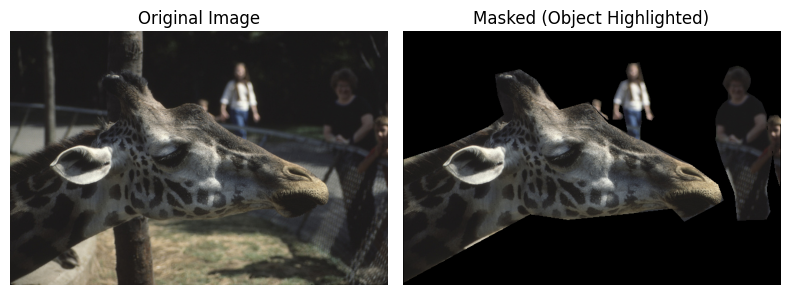

✅ Visualized 12/50


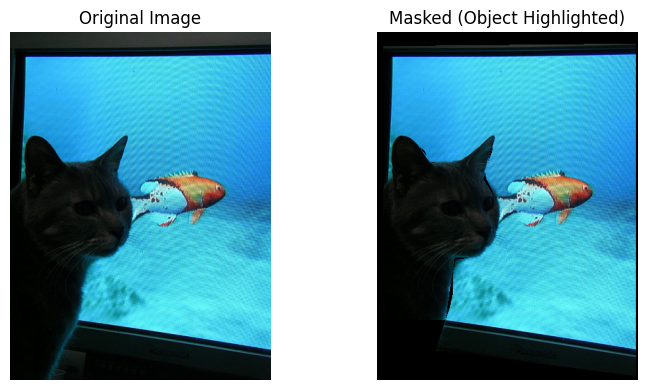

✅ Visualized 13/50


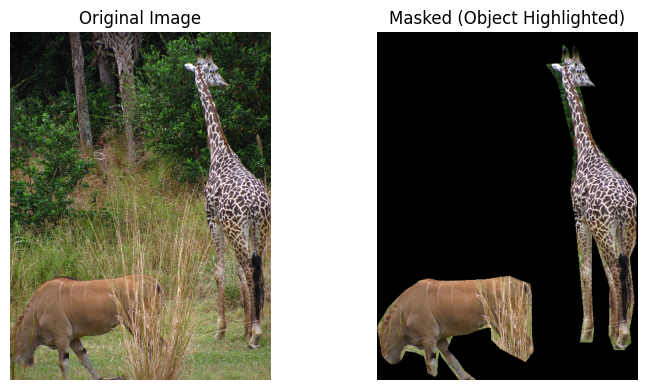

✅ Visualized 14/50


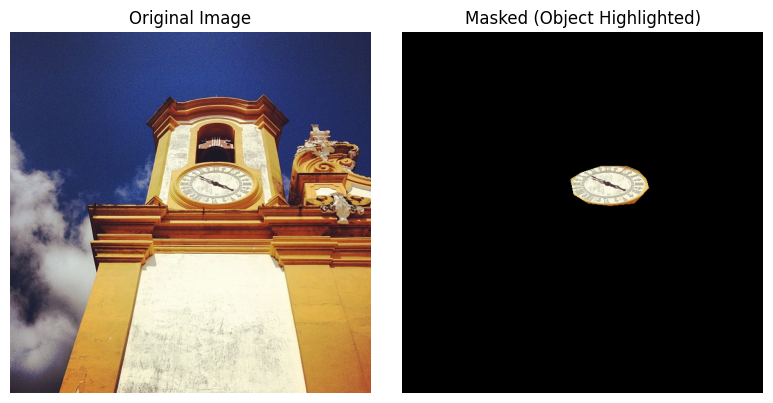

✅ Visualized 15/50


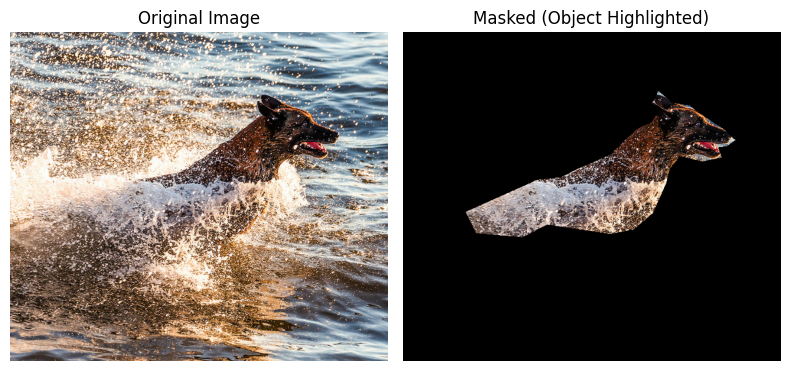

✅ Visualized 16/50


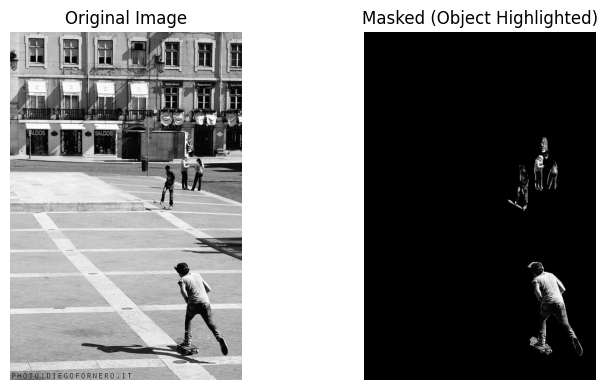

✅ Visualized 17/50


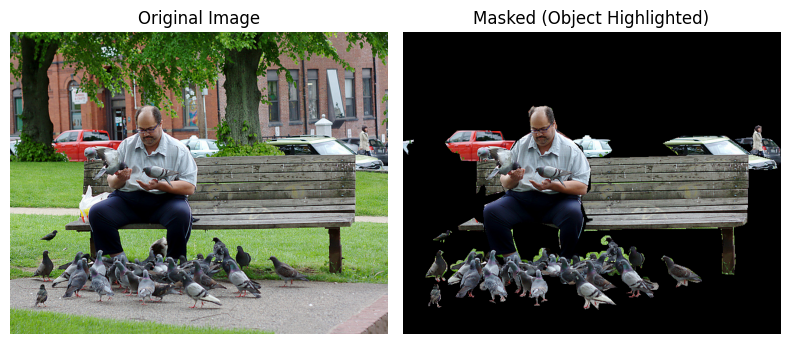

✅ Visualized 18/50


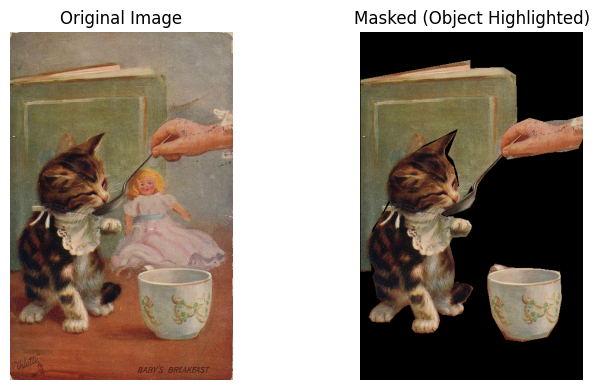

✅ Visualized 19/50


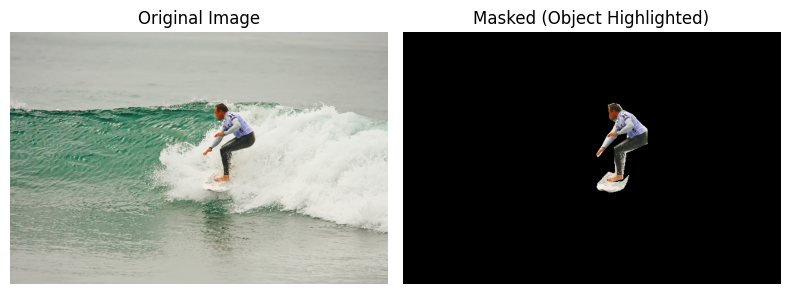

✅ Visualized 20/50


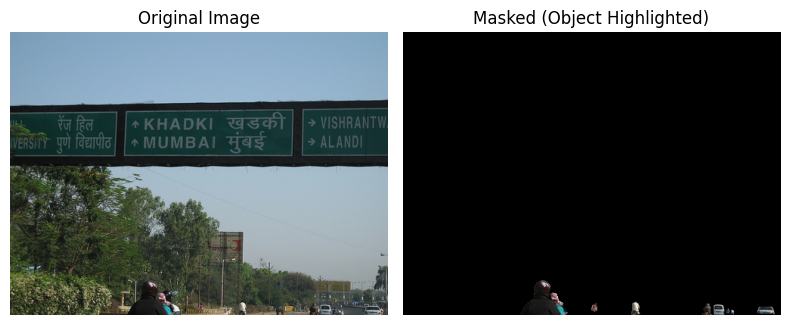

✅ Visualized 21/50


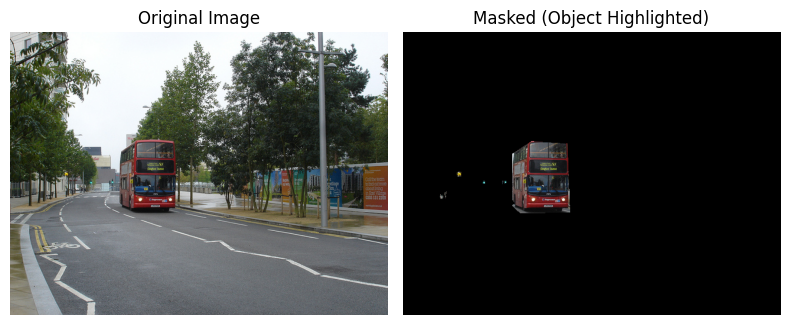

✅ Visualized 22/50


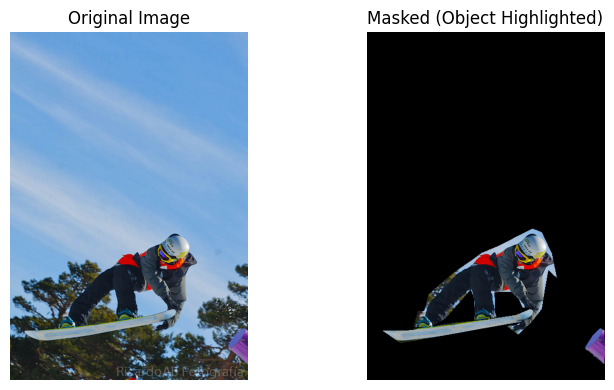

✅ Visualized 23/50


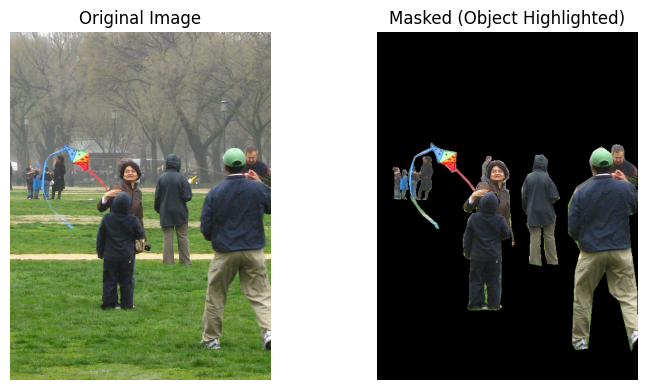

✅ Visualized 24/50


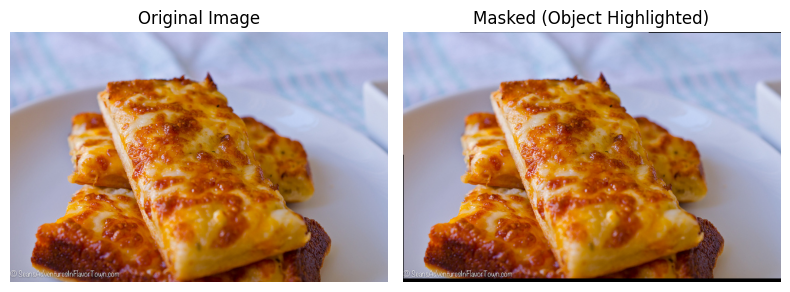

✅ Visualized 25/50


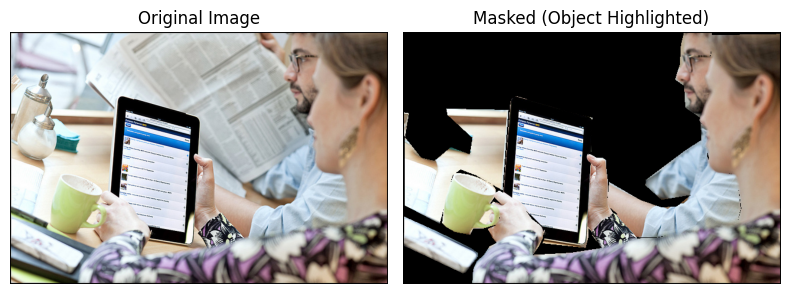

✅ Visualized 26/50


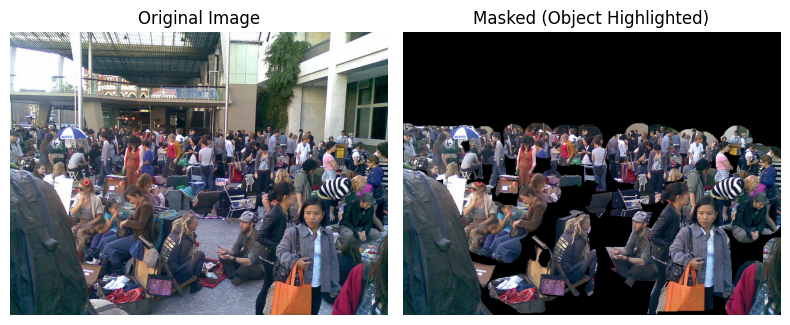

✅ Visualized 27/50


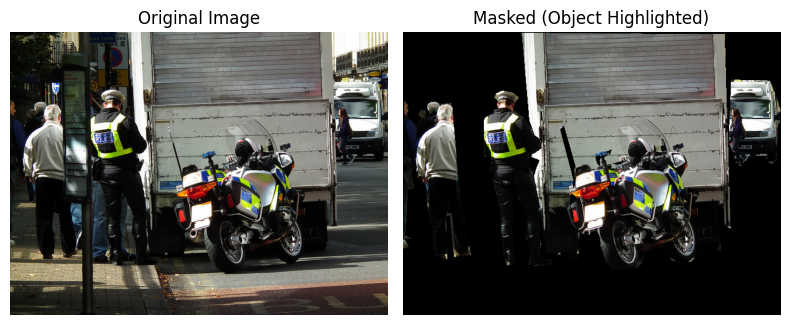

✅ Visualized 28/50


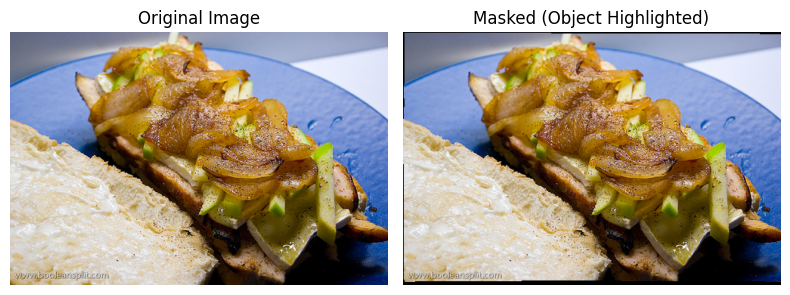

✅ Visualized 29/50


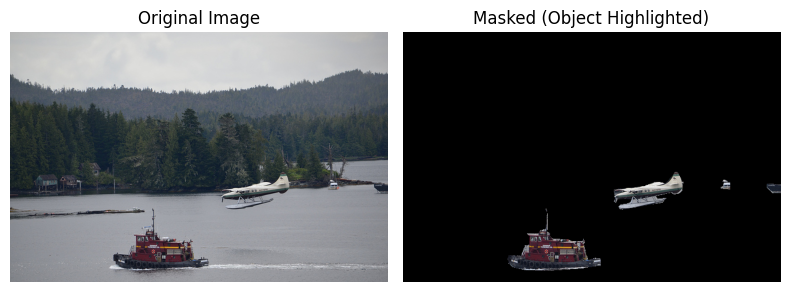

✅ Visualized 30/50


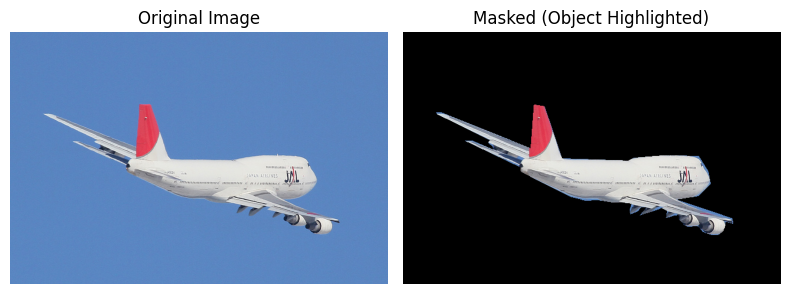

✅ Visualized 31/50


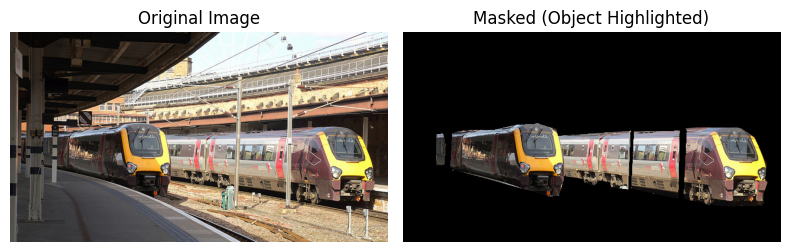

✅ Visualized 32/50


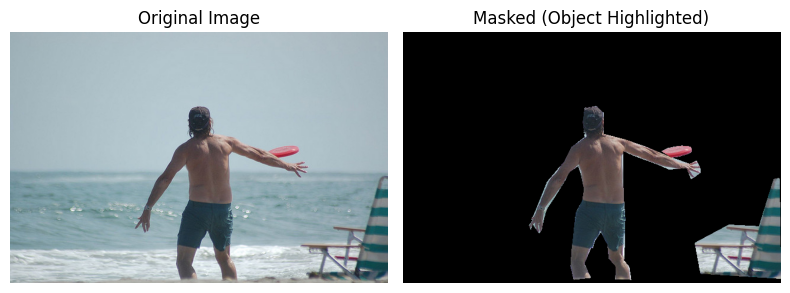

✅ Visualized 33/50


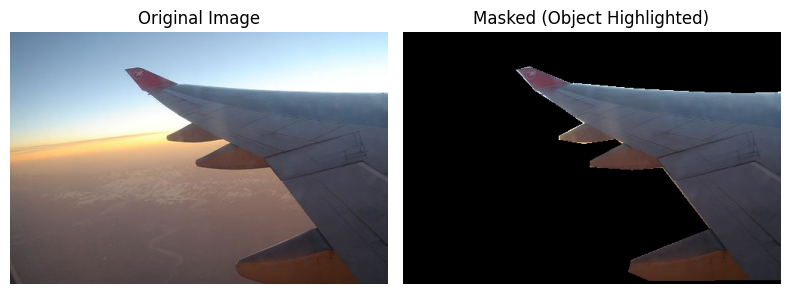

✅ Visualized 34/50


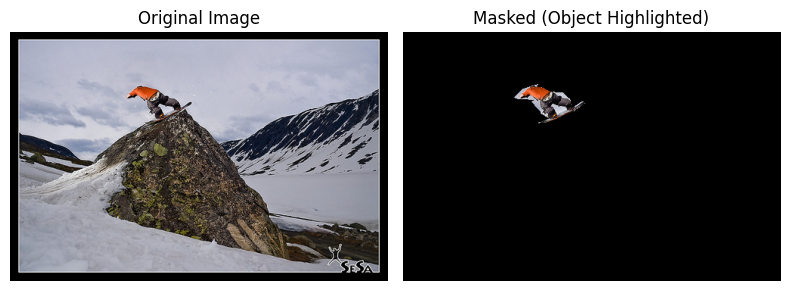

✅ Visualized 35/50


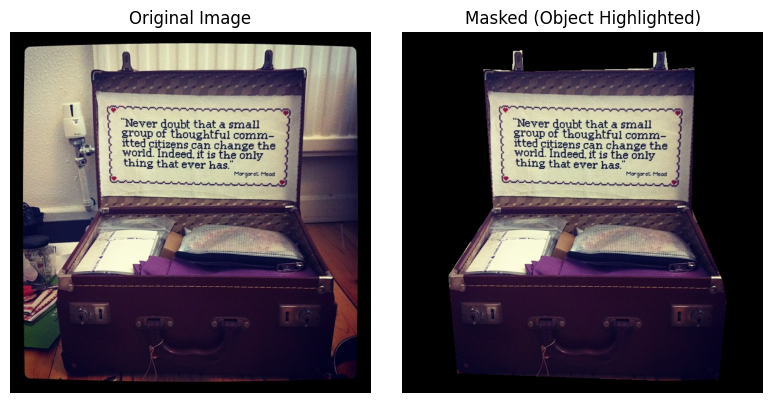

✅ Visualized 36/50


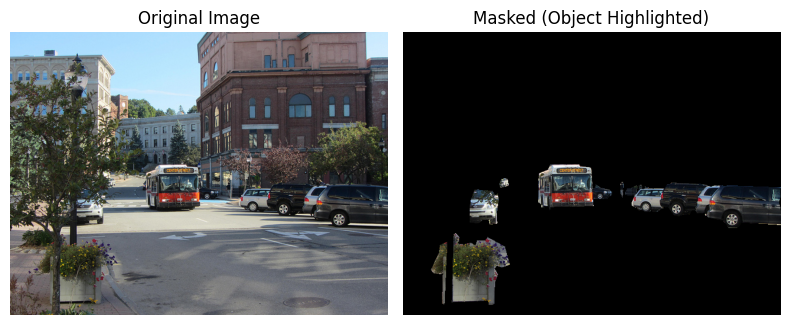

✅ Visualized 37/50


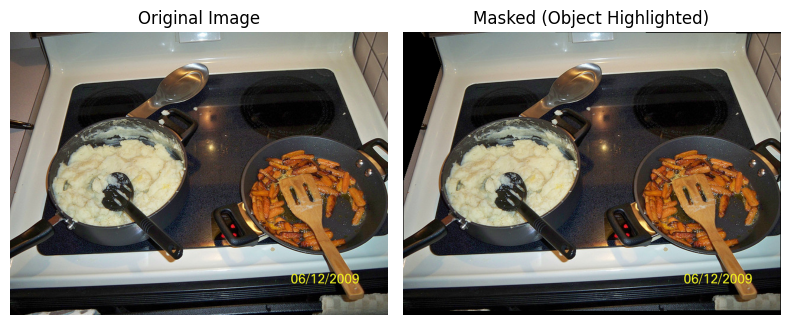

✅ Visualized 38/50


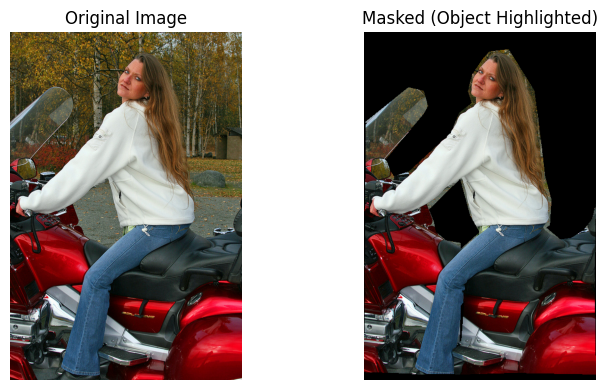

✅ Visualized 39/50


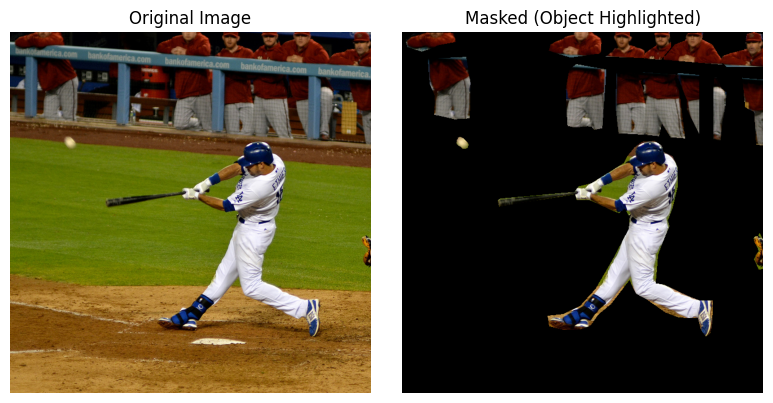

✅ Visualized 40/50


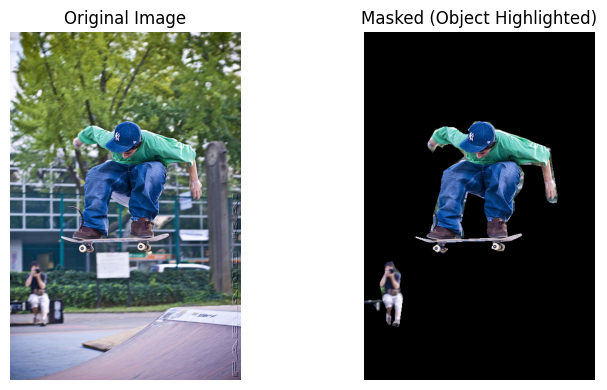

✅ Visualized 41/50


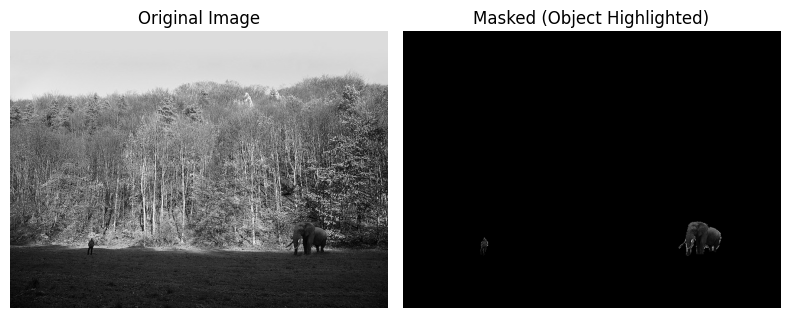

✅ Visualized 42/50


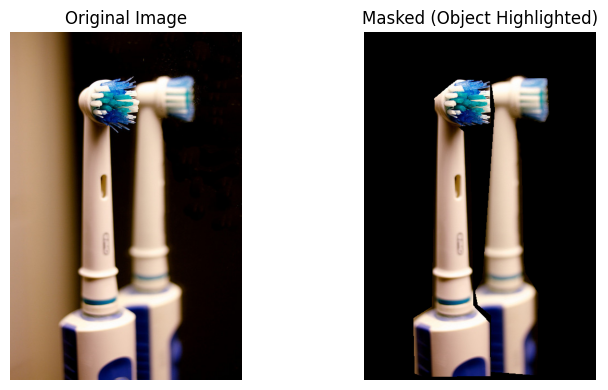

✅ Visualized 43/50


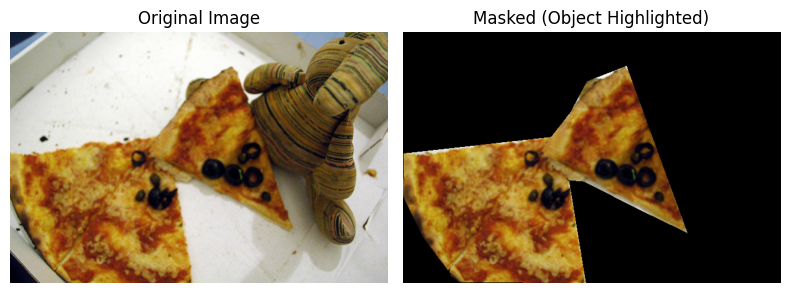

✅ Visualized 44/50


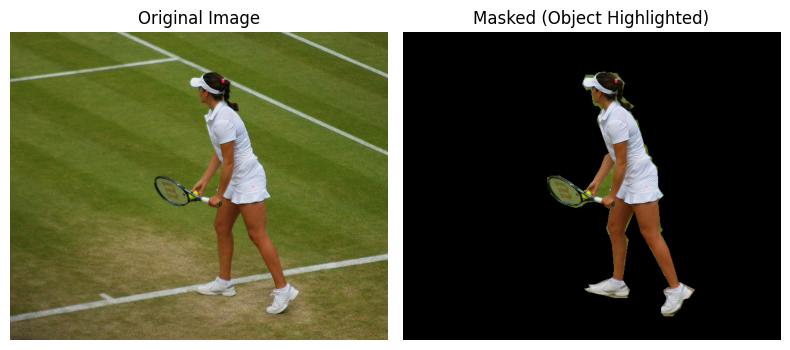

✅ Visualized 45/50


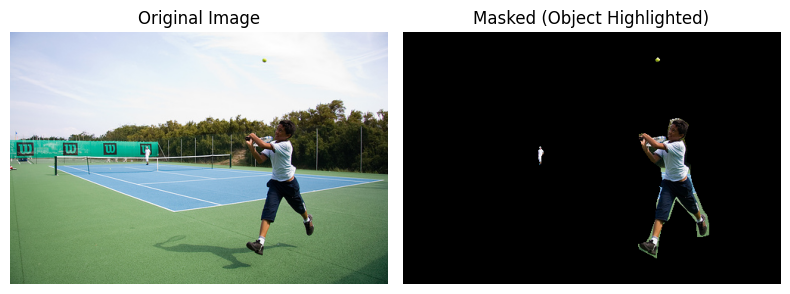

✅ Visualized 46/50


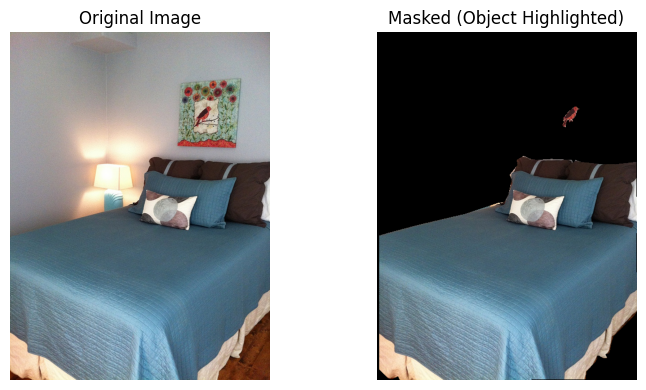

✅ Visualized 47/50


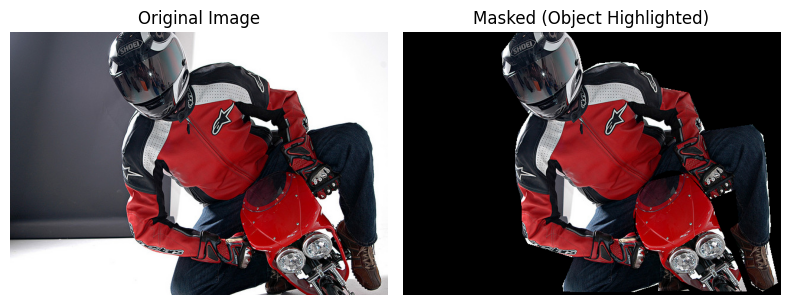

✅ Visualized 48/50


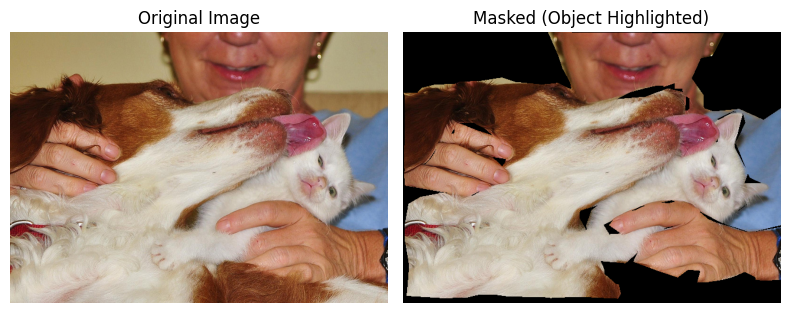

✅ Visualized 49/50


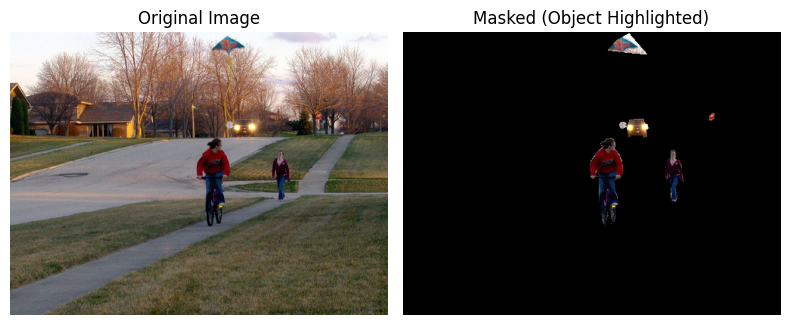

✅ Visualized 50/50

🎯 Milestone 1 (Week 1) successfully completed!


In [13]:
import random
import numpy as np
from PIL import Image
from pycocotools.coco import COCO
import os
import matplotlib.pyplot as plt

def visualize_unique_images(annotation_file, image_dir, num_samples=50, random_seed=20251028):
    print("\n🔹 Loading COCO annotations...")
    coco = COCO(annotation_file)
    img_ids = coco.getImgIds()
    random.Random(random_seed).shuffle(img_ids)
    shown = 0

    for img_id in img_ids:
        if shown >= num_samples:
            break

        img_info = coco.loadImgs(img_id)[0]
        img_path = os.path.join(image_dir, img_info['file_name'])
        if not os.path.exists(img_path):
            continue

        ann_ids = coco.getAnnIds(imgIds=img_info['id'])
        anns = coco.loadAnns(ann_ids)
        if not anns:
            continue

        img = np.array(Image.open(img_path).convert("RGB"))

        mask = np.zeros((img.shape[0], img.shape[1]), dtype=np.uint8)
        for ann in anns:
            mask = np.maximum(mask, coco.annToMask(ann))

        masked_img = img.copy()
        masked_img[mask == 0] = 0

        fig, ax = plt.subplots(1, 2, figsize=(8, 4))
        ax[0].imshow(img)
        ax[0].set_title("Original Image")
        ax[0].axis("off")

        ax[1].imshow(masked_img)
        ax[1].set_title("Masked (Object Highlighted)")
        ax[1].axis("off")

        plt.tight_layout()
        plt.show()

        shown += 1
        print(f"✅ Visualized {shown}/{num_samples}")

print("\n🔹 Visualizing 50 unique image–mask pairs...")
visualize_unique_images(ANNOTATION_FILE, IMAGE_DIR, num_samples=50, random_seed=20251028)
print("\n🎯 Milestone 1 (Week 1) successfully completed!")
